In [ ]:
!pip install kagglehub
!pip install opencv-contrib-python


In [2]:
pip install ultralytics


[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import shutil
import os
import kagglehub

# Download the dataset
dataset_path = kagglehub.dataset_download('sebastianpalaciob/plantvillage-for-object-detection-yolo')

# Destination path you can see in the file explorer
visible_path = '/teamspace/studios/this_studio/plantvillage'

# Create the destination folder if it doesn't exist
os.makedirs(visible_path, exist_ok=True)

# Copy the entire dataset folder to visible directory
shutil.copytree(dataset_path, visible_path, dirs_exist_ok=True)

print("Copied dataset to visible path:", visible_path)


In [1]:
import os
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
import shutil
from shutil import copyfile
import matplotlib.pyplot as plt
from PIL import Image
import random
import ultralytics
from ultralytics import YOLO
ultralytics.checks()

Ultralytics 8.3.111 🚀 Python-3.10.10 torch-2.2.1+cu121 CPU (Intel Xeon Platinum 8175M 2.50GHz)
Setup complete ✅ (4 CPUs, 15.3 GB RAM, 30.6/387.5 GB disk)


In [2]:
img_path='/teamspace/studios/this_studio/plantvillage/PlantVillage_for_object_detection/Dataset/images'
label_path='/teamspace/studios/this_studio/plantvillage/PlantVillage_for_object_detection/Dataset/labels'

In [5]:
ipaths=[]
types=[]
for dirname, _, filenames in os.walk(img_path):
    for filename in filenames:
        ipaths+=[os.path.join(dirname, filename)]
        types+=[filename.split('.')[-1]]
tpaths=[]
for dirname, _, filenames in os.walk(label_path):
    for filename in filenames:
        tpaths+=[os.path.join(dirname, filename)]    
ipaths=sorted(ipaths)
tpaths=sorted(tpaths)
paths=[]
for ip,tp in zip(ipaths,tpaths):
    paths+=[(ip,tp)]
random.shuffle(paths)
ipaths=[]
tpaths=[]
for p in paths:
    ipaths+=[p[0]]
    tpaths+=[p[1]]

In [27]:
import os
import random
from shutil import copyfile

# Collect image-label pairs directly
paths = []
for dirpath, _, filenames in os.walk(img_path):
    for fname in filenames:
        img_fp = os.path.join(dirpath, fname)
        label_fp = os.path.join(label_path, fname.replace('.jpg', '.txt'))  # adjust extension if needed
        if os.path.exists(label_fp):
            paths.append((img_fp, label_fp))

# Shuffle before any sorting
random.shuffle(paths)

# Split based on ratio
total = len(paths)

for i, (ipath, tpath) in enumerate(paths):
    ratio = i / total

    if ratio < 0.7:
        folder = 'train'
    elif ratio < 0.9:
        folder = 'valid'
    else:
        folder = 'test'

    ifile = os.path.basename(ipath)
    tfile = os.path.basename(tpath)

    copyfile(ipath, f'datasets_/{folder}/{ifile}')
    copyfile(tpath, f'datasets_/{folder}/{tfile}')


In [6]:
print(len(ipaths))

54293


In [10]:
print(set(types))
for typei in list(set(types)):
    print(typei,types.count(typei))

{'JPG', 'jpg'}
JPG 1
jpg 54292


In [ ]:
boxdata=[]
boxfile=[]
for i in range(len(tpaths)):
    tfile=tpaths[i]
    ifile=ipaths[i]
    boxdata+=[np.loadtxt(tfile)]     
    boxfile+=[ifile.split('/')[-1]]
print(boxdata[0])

In [12]:
BOX=pd.DataFrame()

for i in range(len(boxdata)):
    if type(boxdata[i][0])==np.float64:
        add=pd.DataFrame([boxdata[i]])
        add[5]=boxfile[i]
        BOX=pd.concat([BOX,add])
    else:
        add=pd.DataFrame(boxdata[i])
        add[5]=boxfile[i]
        BOX=pd.concat([BOX,add])       

BOX2=BOX.reset_index(drop=True)
BOX2.iloc[:,0]=BOX2.iloc[:,0].astype(int)
display(BOX2)

,0,1,2,3,4,5
0,35.0,0.464844,0.482422,0.601562,0.917969,TMYC_image (4576).jpg
1,35.0,0.505859,0.503906,0.878906,0.937500,TMYC_image (1978).jpg
2,5.0,0.513672,0.500000,0.933594,0.992188,CHPM_image (49).jpg
3,2.0,0.476562,0.509766,0.914062,0.949219,APCR_image (149).jpg
4,20.0,0.488281,0.492188,0.976562,0.984375,PTEB_image (117).jpg
...,...,...,...,...,...,...
54343,21.0,0.482422,0.494141,0.933594,0.980469,PTLB_image (230).jpg
54344,24.0,0.453125,0.521484,0.906250,0.910156,SOHE_image (3588).jpg
54345,28.0,0.490234,0.500000,0.964844,0.992188,TMBS_image (192).jpg
54346,35.0,0.460938,0.503906,0.820312,0.773438,TMYC_image (4515).jpg


In [13]:
display(BOX2.iloc[:,0].value_counts())

0
15.0    5507
35.0    5361
24.0    5089
16.0    2297
28.0    2127
30.0    1911
25.0    1835
32.0    1778
33.0    1677
3.0     1645
37.0    1591
4.0     1502
19.0    1477
34.0    1405
12.0    1383
8.0     1192
11.0    1180
10.0    1157
26.0    1134
13.0    1076
5.0     1052
29.0    1004
20.0    1000
21.0    1000
18.0     997
9.0      989
31.0     952
6.0      853
0.0      630
1.0      621
7.0      516
27.0     456
14.0     423
36.0     373
23.0     371
17.0     360
2.0      275
22.0     152
Name: count, dtype: int64

In [14]:
BOX2[5].value_counts()

5
STLS_image (343).jpg     3
TMEB_image (967).jpg     3
CNLB_image (339).jpg     2
TMSL_image (1141).jpg    2
STLS_image (279).jpg     2
                        ..
TMLM_image (649).jpg     1
TMLM_image (439).jpg     1
TMBS_image (1796).jpg    1
APHE_image (642).jpg     1
ORHL_image (1592).jpg    1
Name: count, Length: 54293, dtype: int64

In [7]:
def draw_box(n0):
    
    ipath=ipaths[n0]
    image=cv2.imread(ipath)
    H,W=image.shape[0],image.shape[1]
    file=ipath.split('/')[-1] 
    
    if BOX2[BOX2[5]==file] is not None:
        box=BOX2[BOX2[5]==file]
        box=box.reset_index(drop=True)
        #display(box)
        
        for i in range(len(box)):
            label=int(box.loc[i,0])
            x=box.loc[i,1]
            y=box.loc[i,2]
            w=box.loc[i,3] 
            h=box.loc[i,4]
            x1=((x-w/2)*W).astype(int)
            y1=((y-h/2)*H).astype(int)
            x2=((x+w/2)*W).astype(int)
            y2=((y+h/2)*H).astype(int)
            
            cv2.rectangle(image,(x1,y1),(x2,y2),(0,255,0),2) #green

            cv2.putText(image, f'{label}', (50,50), 
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,255,0), 2)     
    #plt.imshow(image)
    #plt.show()
    
    return image

In [8]:
images1=[]
for i in range(len(ipaths)):
    images1+=[draw_box(i)]

NameError: name 'BOX2' is not defined

In [2]:
from matplotlib import animation, rc
rc('animation', html='jshtml')

In [4]:
def create_animation(ims):    
    fig=plt.figure(figsize=(10,6))
    #plt.axis('off')
    im=plt.imshow(cv2.cvtColor(ims[0],cv2.COLOR_BGR2RGB))
    plt.close()    
    def animate_func(i):
        im.set_array(cv2.cvtColor(ims[i],cv2.COLOR_BGR2RGB))
        return [im]
    return animation.FuncAnimation(fig, animate_func, frames=len(ims), interval=1000//2)

In [ ]:
create_animation(images1)

In [17]:
os.makedirs('datasets', exist_ok=True)
os.makedirs('datasets/train', exist_ok=True)
os.makedirs('datasets/valid', exist_ok=True)
os.makedirs('datasets/test', exist_ok=True)

In [24]:
os.makedirs('datasets_', exist_ok=True)
os.makedirs('datasets_/train', exist_ok=True)
os.makedirs('datasets_/valid', exist_ok=True)
os.makedirs('datasets_/test', exist_ok=True)

In [18]:
from shutil import copyfile

total = len(ipaths)

for i, (ipath, tpath) in enumerate(zip(ipaths, tpaths)):
    ifile = ipath.split('/')[-1]
    tfile = tpath.split('/')[-1]

    ratio = i / total

    if ratio < 0.7:
        folder = 'train'
    elif ratio < 0.9:
        folder = 'valid'
    else:
        folder = 'test'

    copyfile(ipath, f'datasets/{folder}/{ifile}')
    copyfile(tpath, f'datasets/{folder}/{tfile}')


In [19]:
import yaml

class_names = [
    'Apple___Apple_scab',
    'Apple___Black_rot',
    'Apple___Cedar_apple_rust',
    'Apple___healthy',
    'Blueberry___healthy',
    'Cherry___Powdery_mildew',
    'Cherry___healthy',
    'Corn___Cercospora_leaf_spot Gray_leaf_spot',
    'Corn___Common_rust',
    'Corn___Northern_Leaf_Blight',
    'Corn___healthy',
    'Grape___Black_rot',
    'Grape___Esca_(Black_Measles)',
    'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
    'Grape___healthy',
    'Orange___Haunglongbing_(Citrus_greening)',
    'Peach___Bacterial_spot',
    'Peach___healthy',
    'Pepper,_bell___Bacterial_spot',
    'Pepper,_bell___healthy',
    'Potato___Early_blight',
    'Potato___Late_blight',
    'Potato___healthy',
    'Raspberry___healthy',
    'Soybean___healthy',
    'Squash___Powdery_mildew',
    'Strawberry___Leaf_scorch',
    'Strawberry___healthy',
    'Tomato___Bacterial_spot',
    'Tomato___Early_blight',
    'Tomato___Late_blight',
    'Tomato___Leaf_Mold',
    'Tomato___Septoria_leaf_spot',
    'Tomato___Spider_mites Two-spotted_spider_mite',
    'Tomato___Target_Spot',
    'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
    'Tomato___Tomato_mosaic_virus',
    'Tomato___healthy'
]

face_yaml = dict(
    train='train',
    val='valid',
    test='test',
    nc=len(class_names),
    names=class_names
)

with open('face.yaml', 'w') as outfile:
    yaml.dump(face_yaml, outfile, default_flow_style=True)
    
%cat face.yaml

{names: [Apple___Apple_scab, Apple___Black_rot, Apple___Cedar_apple_rust, Apple___healthy,
    Blueberry___healthy, Cherry___Powdery_mildew, Cherry___healthy, Corn___Cercospora_leaf_spot
      Gray_leaf_spot, Corn___Common_rust, Corn___Northern_Leaf_Blight, Corn___healthy,
    Grape___Black_rot, Grape___Esca_(Black_Measles), Grape___Leaf_blight_(Isariopsis_Leaf_Spot),
    Grape___healthy, Orange___Haunglongbing_(Citrus_greening), Peach___Bacterial_spot,
    Peach___healthy, 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', Potato___Early_blight,
    Potato___Late_blight, Potato___healthy, Raspberry___healthy, Soybean___healthy,
    Squash___Powdery_mildew, Strawberry___Leaf_scorch, Strawberry___healthy, Tomato___Bacterial_spot,
    Tomato___Early_blight, Tomato___Late_blight, Tomato___Leaf_Mold, Tomato___Septoria_leaf_spot,
    Tomato___Spider_mites Two-spotted_spider_mite, Tomato___Target_Spot, Tomato___Tomato_Yellow_Leaf_Curl_Virus,
    Tomato___Tomato_mosaic_virus, Tomato__

In [20]:
model = YOLO("yolo11n.pt")

100%|██████████| 5.35M/5.35M [00:00<00:00, 158MB/s]


In [4]:
modelv8 = YOLO("yolov8n.pt")

In [1]:
import subprocess

subprocess.run([
    "yolo", "detect", "train",
    "model=yolo11n.pt",
    "data=face.yaml",
    "epochs=20",
    "imgsz=640",
    "hsv_h=0.015", "hsv_s=0.7", "hsv_v=0.4",
    "degrees=5", "translate=0.1", "scale=0.5", "shear=1.5",
    "perspective=0.001", "flipud=0.2", "fliplr=0.5",
    "mosaic=1.0", "mixup=0.2", "copy_paste=0.1"
])


Ultralytics 8.3.111 🚀 Python-3.10.10 torch-2.2.1+cu121 CUDA:0 (NVIDIA L40S, 45596MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=face.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=t

100%|██████████| 755k/755k [00:00<00:00, 78.3MB/s]


  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  8                  -1  1    346112  ultralytics.nn.modules.block.C3k2            [256, 256, 1, True]           
  9                  -1  1    164608  ultralytics.nn.modules.block.SPPF            [256, 256, 5]                 
 10                  -1  1    249728  ultralytics.nn.modules.block.C2PSA           [256, 256, 1]                 
 11                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 12             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 13                  -1  1    111296  ultralytics.nn.modules.block.C3k2            [384,

train: Scanning /teamspace/studios/this_studio/datasets/train... 38006 images, 0 backgrounds, 0 corrupt: 100%|██████████| 38006/38006 [10:19<00:00, 61.36it/s]


train: New cache created: /teamspace/studios/this_studio/datasets/train.cache
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 790.3±215.4 MB/s, size: 19.7 KB)


val: Scanning /teamspace/studios/this_studio/datasets/valid... 10858 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10858/10858 [00:05<00:00, 1880.22it/s]


val: New cache created: /teamspace/studios/this_studio/datasets/valid.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      2.31G     0.8032      2.956      1.464         25        640: 100%|██████████| 2376/2376 [04:52<00:00,  8.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:41<00:00,  8.23it/s]


                   all      10858      10871      0.601      0.664      0.681      0.589

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      2.47G     0.6857      1.681      1.336         26        640: 100%|██████████| 2376/2376 [03:08<00:00, 12.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:29<00:00, 11.55it/s]


                   all      10858      10871       0.83      0.816      0.899      0.803

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      2.47G     0.6886      1.461      1.325         23        640: 100%|██████████| 2376/2376 [03:03<00:00, 12.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:29<00:00, 11.49it/s]


                   all      10858      10871      0.785      0.757      0.861      0.755

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      2.47G     0.6714      1.263      1.308         25        640: 100%|██████████| 2376/2376 [03:01<00:00, 13.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:29<00:00, 11.58it/s]


                   all      10858      10871      0.924      0.921      0.969      0.859

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      2.47G      0.624      1.065       1.27         24        640: 100%|██████████| 2376/2376 [03:04<00:00, 12.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:31<00:00, 10.83it/s]


                   all      10858      10871      0.914      0.921      0.975        0.9

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      2.47G     0.5953     0.9708      1.247         25        640: 100%|██████████| 2376/2376 [03:06<00:00, 12.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:28<00:00, 11.78it/s]


                   all      10858      10871       0.96       0.97      0.987      0.908

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      2.47G     0.5737     0.8983      1.231         18        640: 100%|██████████| 2376/2376 [03:01<00:00, 13.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:29<00:00, 11.71it/s]


                   all      10858      10871      0.978      0.971       0.99      0.942

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      2.47G     0.5529     0.8472      1.217         25        640: 100%|██████████| 2376/2376 [03:01<00:00, 13.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:28<00:00, 11.79it/s]


                   all      10858      10871      0.973      0.976      0.991      0.938

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      2.47G      0.537     0.8051      1.204         24        640: 100%|██████████| 2376/2376 [03:01<00:00, 13.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:29<00:00, 11.72it/s]


                   all      10858      10871      0.977      0.983      0.992      0.949

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      2.47G      0.523     0.7743      1.195         26        640: 100%|██████████| 2376/2376 [03:04<00:00, 12.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:29<00:00, 11.69it/s]


                   all      10858      10871      0.986      0.981      0.992      0.954
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      2.47G     0.2183     0.2957      1.077          6        640: 100%|██████████| 2376/2376 [02:56<00:00, 13.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:31<00:00, 10.83it/s]


                   all      10858      10871      0.984      0.979      0.991      0.969

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      2.47G     0.1914     0.2486      1.054          6        640: 100%|██████████| 2376/2376 [02:56<00:00, 13.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:29<00:00, 11.65it/s]


                   all      10858      10871      0.979      0.984      0.992      0.971

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      2.47G     0.1764     0.2225      1.037          6        640: 100%|██████████| 2376/2376 [02:56<00:00, 13.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:28<00:00, 11.76it/s]


                   all      10858      10871      0.986      0.982      0.992      0.981

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      2.47G     0.1646      0.202      1.027          6        640: 100%|██████████| 2376/2376 [02:59<00:00, 13.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:29<00:00, 11.59it/s]


                   all      10858      10871      0.987      0.986      0.992       0.98

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      2.47G     0.1548     0.1789      1.021          6        640: 100%|██████████| 2376/2376 [02:58<00:00, 13.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:28<00:00, 11.82it/s]


                   all      10858      10871      0.989      0.984      0.993      0.981

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      2.47G     0.1466     0.1617      1.011          6        640: 100%|██████████| 2376/2376 [02:55<00:00, 13.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:28<00:00, 11.84it/s]


                   all      10858      10871      0.986      0.985      0.992       0.98

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      2.47G     0.1395     0.1497      1.006          6        640: 100%|██████████| 2376/2376 [02:59<00:00, 13.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:29<00:00, 11.54it/s]


                   all      10858      10871       0.99      0.986      0.993      0.985

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      2.47G     0.1306     0.1273     0.9974          6        640: 100%|██████████| 2376/2376 [03:00<00:00, 13.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:30<00:00, 10.99it/s]


                   all      10858      10871      0.988       0.99      0.993      0.985

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      2.47G     0.1223     0.1141     0.9911          6        640: 100%|██████████| 2376/2376 [02:56<00:00, 13.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:28<00:00, 11.88it/s]


                   all      10858      10871      0.988       0.99      0.993      0.986

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      2.47G     0.1138     0.1003     0.9837          6        640: 100%|██████████| 2376/2376 [02:56<00:00, 13.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:29<00:00, 11.71it/s]


                   all      10858      10871       0.99      0.987      0.993      0.986

20 epochs completed in 1.202 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.111 🚀 Python-3.10.10 torch-2.2.1+cu121 CUDA:0 (NVIDIA L40S, 45596MiB)
YOLO11n summary (fused): 100 layers, 2,589,562 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:32<00:00, 10.35it/s]


                   all      10858      10871      0.988       0.99      0.993      0.986
    Apple___Apple_scab        105        105          1      0.989      0.995      0.985
     Apple___Black_rot        124        124      0.995          1      0.995      0.992
Apple___Cedar_apple_rust         56         56       0.99          1      0.995      0.993
       Apple___healthy        342        342      0.995          1      0.995      0.986
   Blueberry___healthy        297        297      0.995          1      0.995      0.989
Cherry___Powdery_mildew        215        215          1          1      0.995      0.994
      Cherry___healthy        183        183      0.997          1      0.995      0.993
Corn___Cercospora_leaf_spot Gray_leaf_spot         95         95      0.917      0.936      0.959      0.938
    Corn___Common_rust        249        249      0.998          1      0.995      0.992
Corn___Northern_Leaf_Blight        209        209      0.952      0.956      0.987     

CompletedProcess(args=['yolo', 'detect', 'train', 'model=yolo11n.pt', 'data=face.yaml', 'epochs=20', 'imgsz=640', 'hsv_h=0.015', 'hsv_s=0.7', 'hsv_v=0.4', 'degrees=5', 'translate=0.1', 'scale=0.5', 'shear=1.5', 'perspective=0.001', 'flipud=0.2', 'fliplr=0.5', 'mosaic=1.0', 'mixup=0.2', 'copy_paste=0.1'], returncode=0)

In [11]:
import os
import shutil

# original data locations
original_splits = {
    "train": "datasets_/train",
    "valid": "datasets_/valid",
    "test": "datasets_/test"
}

# new structured directories
target_root = "datasets_structured"

for split, src_dir in original_splits.items():
    images_dir = os.path.join(target_root, split, "images")
    labels_dir = os.path.join(target_root, split, "labels")
    os.makedirs(images_dir, exist_ok=True)
    os.makedirs(labels_dir, exist_ok=True)

    for file in os.listdir(src_dir):
        src_file = os.path.join(src_dir, file)
        if file.endswith((".jpg", ".png")):
            shutil.copy(src_file, os.path.join(images_dir, file))
        elif file.endswith(".txt"):
            shutil.copy(src_file, os.path.join(labels_dir, file))

print("✅ Dataset copied into new structured folders.")


✅ Dataset copied into new structured folders.


In [2]:
import subprocess

subprocess.run([
    "yolo", "detect", "train",
    "model=yolov8n.pt",
    "data=facev8.yaml",
    "epochs=20",
    "imgsz=640",
    "hsv_h=0.015", "hsv_s=0.7", "hsv_v=0.4",
    "degrees=5", "translate=0.1", "scale=0.5", "shear=1.5",
    "perspective=0.001", "flipud=0.2", "fliplr=0.5",
    "mosaic=1.0", "mixup=0.2", "copy_paste=0.1"
])


New https://pypi.org/project/ultralytics/8.3.134 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.111 🚀 Python-3.10.10 torch-2.2.1+cu121 CUDA:0 (NVIDIA L40S, 45596MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=facev8.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train10, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save

train: Scanning /teamspace/studios/this_studio/datasets_structured/train/labels.cache... 38005 images, 0 backgrounds, 0 corrupt: 100%|██████████| 38005/38005 [00:00<?, ?it/s]


val: Fast image access ✅ (ping: 0.1±0.0 ms, read: 0.2±0.2 MB/s, size: 16.3 KB)


val: Scanning /teamspace/studios/this_studio/datasets_structured/valid/labels.cache... 10858 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10858/10858 [00:00<?, ?it/s]


Plotting labels to runs/detect/train10/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train10
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20       2.1G      0.816      2.966      1.469         22        640: 100%|██████████| 2376/2376 [07:33<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:30<00:00, 11.09it/s]


                   all      10858      10869      0.566      0.603      0.615      0.515

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      2.13G     0.6898      1.763      1.338         23        640: 100%|██████████| 2376/2376 [04:52<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:29<00:00, 11.62it/s]


                   all      10858      10869      0.796       0.78      0.863      0.743

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      2.13G     0.6888      1.508      1.325         18        640: 100%|██████████| 2376/2376 [03:04<00:00, 12.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:29<00:00, 11.52it/s]


                   all      10858      10869      0.824       0.86      0.932      0.816

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      2.13G     0.6717       1.29      1.307         23        640: 100%|██████████| 2376/2376 [02:29<00:00, 15.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:28<00:00, 11.87it/s]


                   all      10858      10869      0.908      0.918      0.973      0.889

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      2.13G     0.6242      1.098      1.269         15        640: 100%|██████████| 2376/2376 [02:28<00:00, 16.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:28<00:00, 11.89it/s]


                   all      10858      10869      0.943      0.943      0.981      0.904

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      2.13G     0.5931     0.9954      1.245         19        640: 100%|██████████| 2376/2376 [02:28<00:00, 15.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:28<00:00, 11.99it/s]


                   all      10858      10869      0.956      0.965      0.987      0.916

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      2.13G     0.5737     0.9302      1.231         13        640: 100%|██████████| 2376/2376 [02:36<00:00, 15.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:28<00:00, 11.73it/s]


                   all      10858      10869      0.966      0.969      0.989      0.921

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      2.13G     0.5566     0.8825      1.219         14        640: 100%|██████████| 2376/2376 [02:33<00:00, 15.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:27<00:00, 12.35it/s]


                   all      10858      10869      0.973      0.975      0.991      0.936

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      2.13G     0.5387     0.8395      1.204         14        640: 100%|██████████| 2376/2376 [02:24<00:00, 16.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:26<00:00, 12.92it/s]


                   all      10858      10869      0.975       0.98      0.991      0.941

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      2.13G     0.5274      0.808      1.197         18        640: 100%|██████████| 2376/2376 [02:24<00:00, 16.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:26<00:00, 12.75it/s]


                   all      10858      10869      0.974      0.981      0.992      0.949
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      2.13G      0.223     0.3167      1.077          5        640: 100%|██████████| 2376/2376 [02:24<00:00, 16.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:27<00:00, 12.51it/s]


                   all      10858      10869      0.981      0.981      0.992      0.971

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      2.13G       0.19     0.2642      1.048          5        640: 100%|██████████| 2376/2376 [02:16<00:00, 17.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:26<00:00, 12.63it/s]


                   all      10858      10869      0.985      0.986      0.992      0.974

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      2.13G     0.1756     0.2361      1.035          5        640: 100%|██████████| 2376/2376 [02:23<00:00, 16.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:26<00:00, 12.66it/s]


                   all      10858      10869      0.985      0.989      0.993      0.979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      2.13G     0.1626     0.2124      1.023          5        640: 100%|██████████| 2376/2376 [02:17<00:00, 17.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:26<00:00, 12.68it/s]


                   all      10858      10869       0.99      0.986      0.993      0.984

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      2.13G     0.1565     0.1964      1.017          5        640: 100%|██████████| 2376/2376 [02:17<00:00, 17.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:26<00:00, 12.65it/s]


                   all      10858      10869      0.987       0.99      0.993      0.984

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      2.13G      0.147     0.1753      1.008          5        640: 100%|██████████| 2376/2376 [02:17<00:00, 17.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:26<00:00, 12.91it/s]


                   all      10858      10869      0.987      0.992      0.994      0.986

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      2.13G     0.1377     0.1573      1.003          5        640: 100%|██████████| 2376/2376 [02:17<00:00, 17.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:26<00:00, 12.73it/s]


                   all      10858      10869      0.991       0.99      0.994      0.986

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      2.13G     0.1294     0.1417     0.9947          5        640: 100%|██████████| 2376/2376 [02:17<00:00, 17.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:28<00:00, 11.97it/s]


                   all      10858      10869      0.991      0.993      0.994      0.988

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      2.13G     0.1214     0.1271     0.9891          5        640: 100%|██████████| 2376/2376 [02:21<00:00, 16.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:26<00:00, 12.89it/s]


                   all      10858      10869      0.992      0.992      0.994      0.988

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      2.13G        inf      0.112     0.9834          5        640: 100%|██████████| 2376/2376 [02:17<00:00, 17.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:26<00:00, 12.72it/s]


                   all      10858      10869      0.993      0.992      0.994      0.988

20 epochs completed in 1.091 hours.
Optimizer stripped from runs/detect/train10/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train10/weights/best.pt, 6.3MB

Validating runs/detect/train10/weights/best.pt...
Ultralytics 8.3.111 🚀 Python-3.10.10 torch-2.2.1+cu121 CUDA:0 (NVIDIA L40S, 45596MiB)
Model summary (fused): 72 layers, 3,013,058 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 340/340 [00:30<00:00, 11.13it/s]


                   all      10858      10869      0.993      0.992      0.994      0.988
    Apple___Apple_scab        131        131      0.985      0.995      0.994      0.984
     Apple___Black_rot        145        145      0.985          1      0.995      0.993
Apple___Cedar_apple_rust         63         63      0.996          1      0.995      0.994
       Apple___healthy        348        348      0.991          1      0.995      0.989
   Blueberry___healthy        305        305          1      0.998      0.995      0.988
Cherry___Powdery_mildew        246        246      0.994      0.992      0.995      0.993
      Cherry___healthy        183        183          1      0.996      0.995      0.994
Corn___Cercospora_leaf_spot_Gray_leaf_spot        104        104      0.925      0.913      0.974      0.954
    Corn___Common_rust        236        236      0.998          1      0.995      0.991
Corn___Northern_Leaf_Blight        200        201      0.985      0.951      0.991     

CompletedProcess(args=['yolo', 'detect', 'train', 'model=yolov8n.pt', 'data=facev8.yaml', 'epochs=20', 'imgsz=640', 'hsv_h=0.015', 'hsv_s=0.7', 'hsv_v=0.4', 'degrees=5', 'translate=0.1', 'scale=0.5', 'shear=1.5', 'perspective=0.001', 'flipud=0.2', 'fliplr=0.5', 'mosaic=1.0', 'mixup=0.2', 'copy_paste=0.1'], returncode=0)

In [4]:
tpaths2=[]
for dirname, _, filenames in os.walk('runs/detect/train'):
    for filename in filenames:
        if filename[-4:]=='.png' or filename[-4:]=='.jpg':
            tpaths2+=[(os.path.join(dirname, filename))]
tpaths2=sorted(tpaths2)
print(tpaths2[0])

runs/detect/train/F1_curve.png


In [7]:
tpaths3=[]
for dirname, _, filenames in os.walk('runs/detect/train10'):
    for filename in filenames:
        if filename[-4:]=='.png' or filename[-4:]=='.jpg':
            tpaths2+=[(os.path.join(dirname, filename))]
tpaths2=sorted(tpaths2)
print(tpaths2[0])

runs/detect/train/F1_curve.png


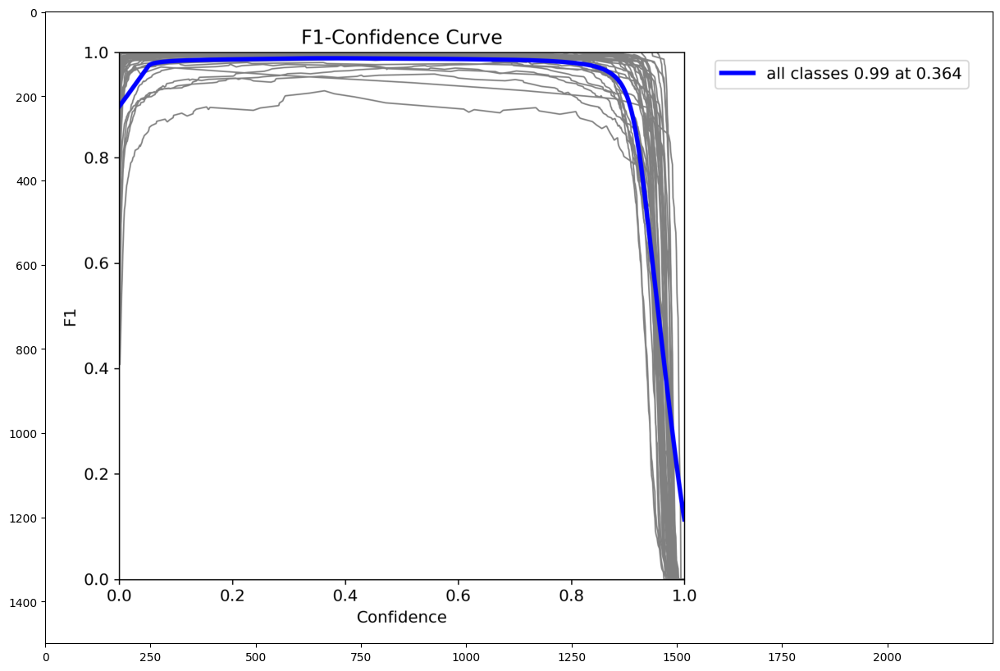

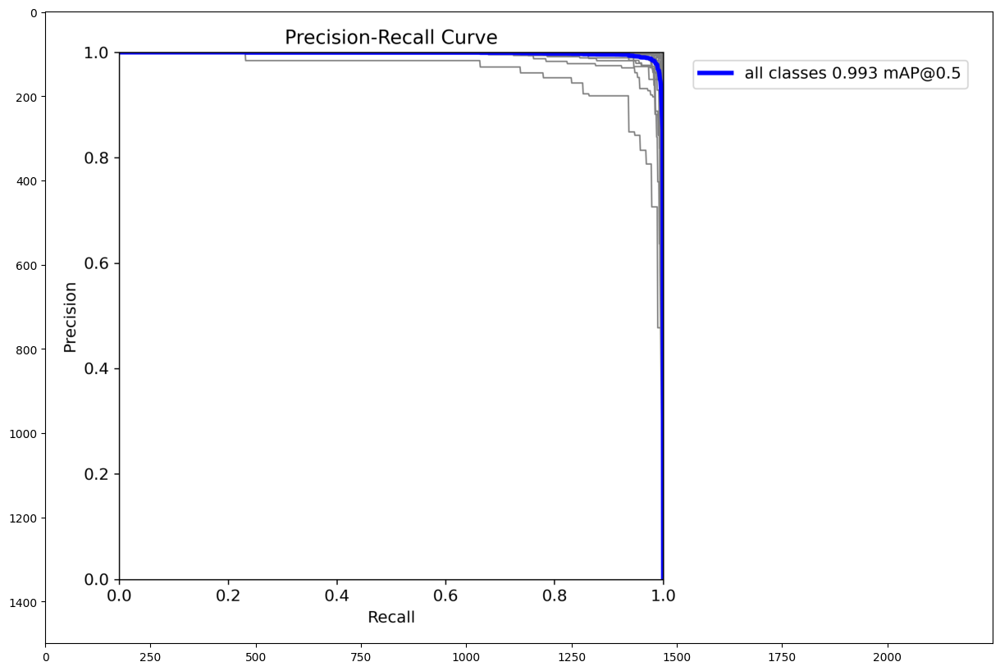

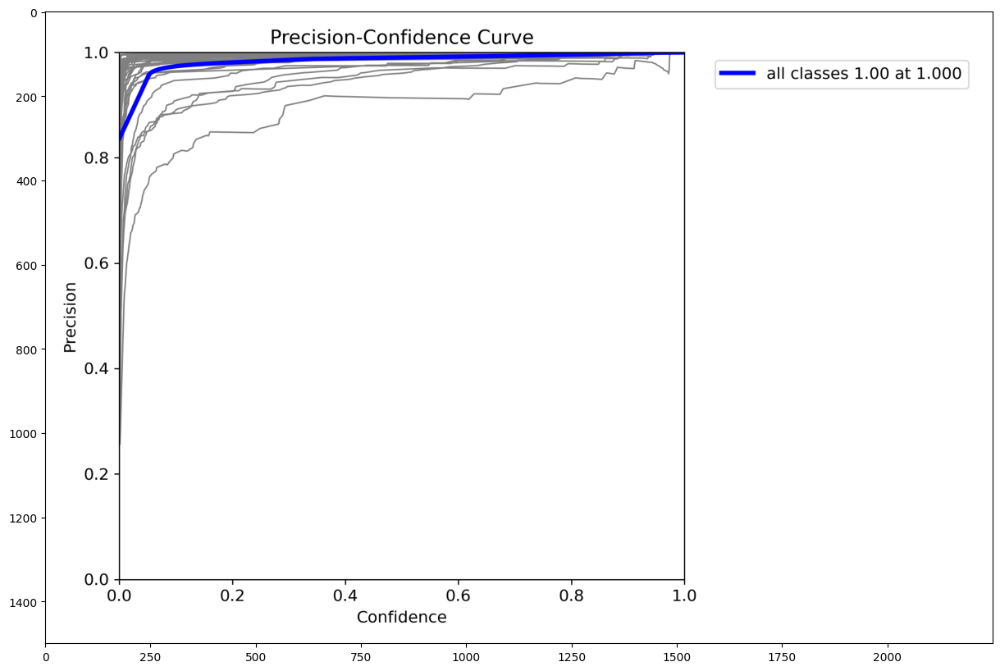

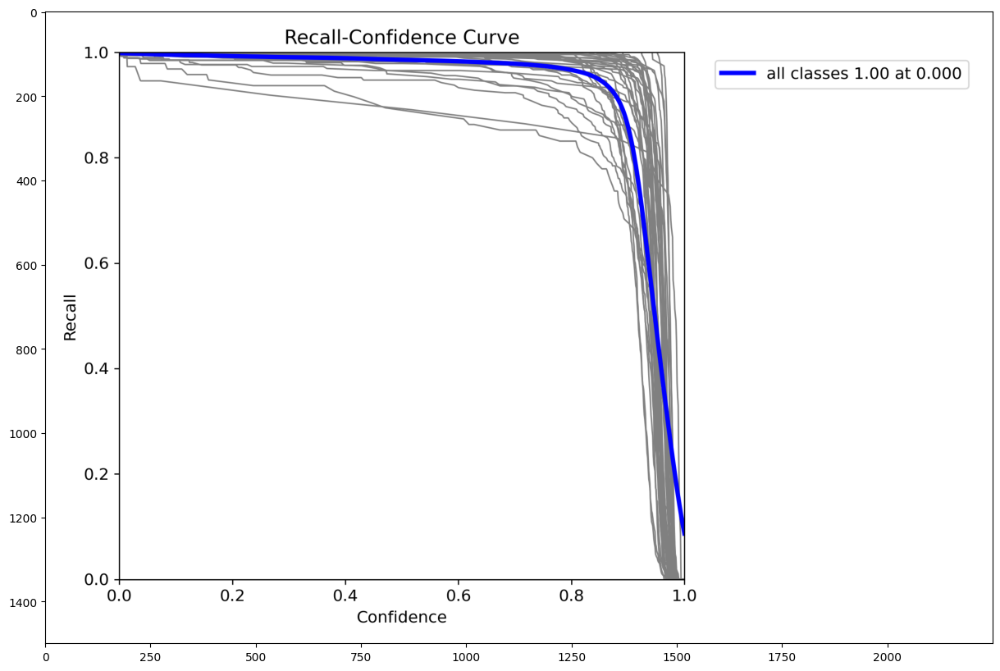

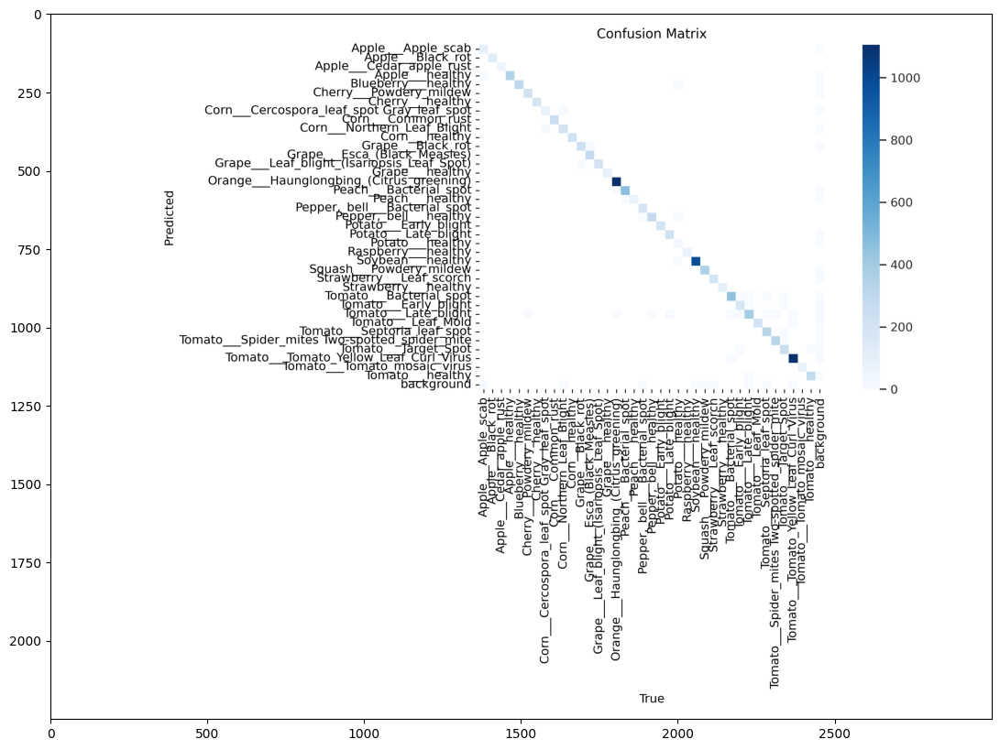

...

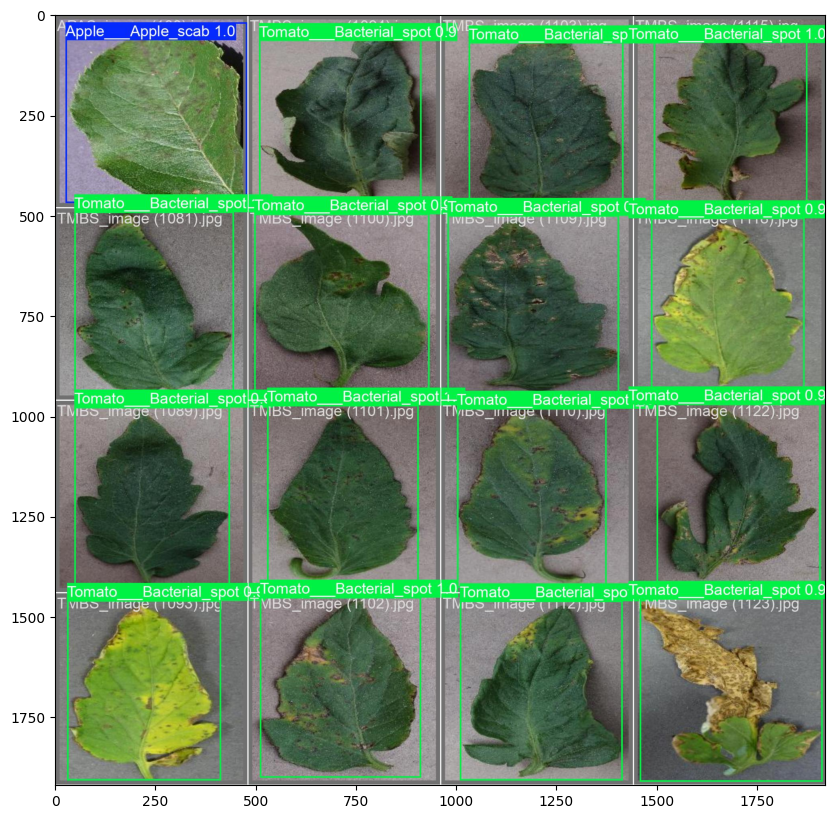

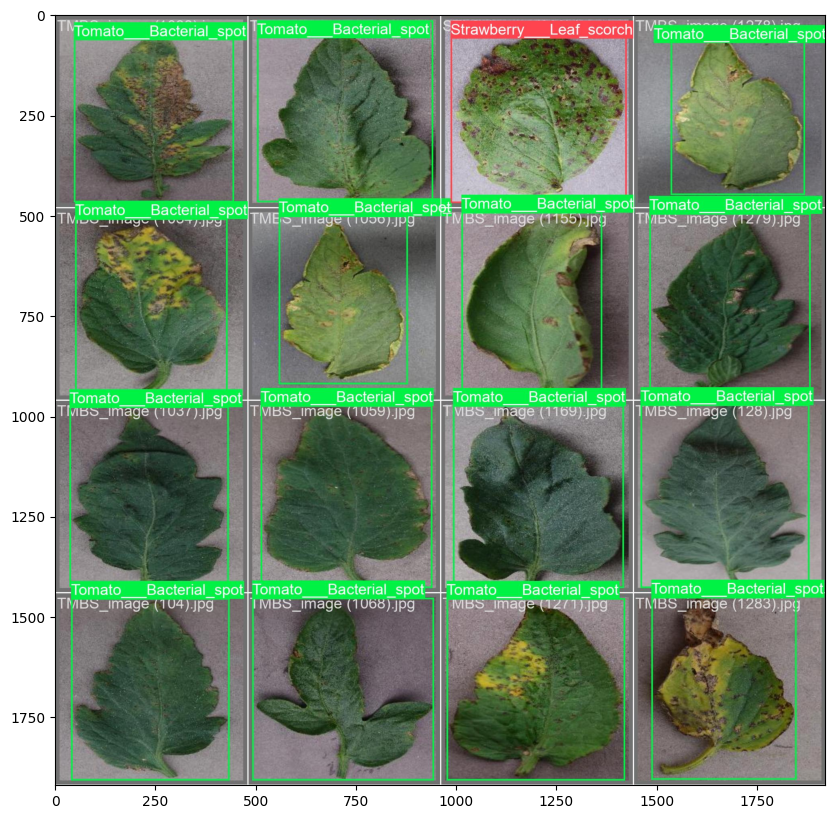

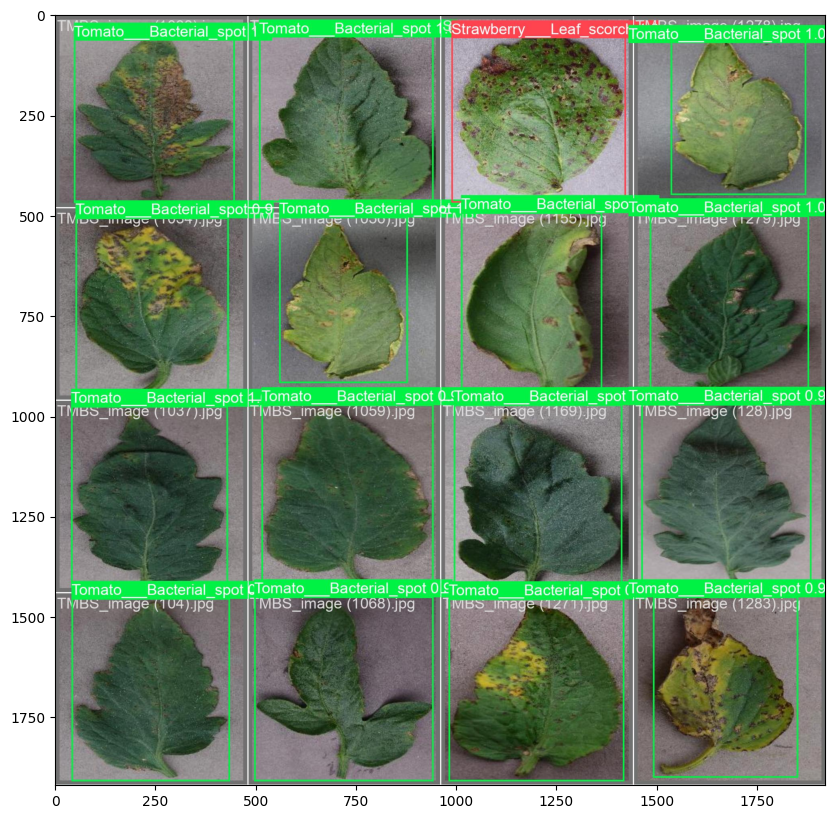

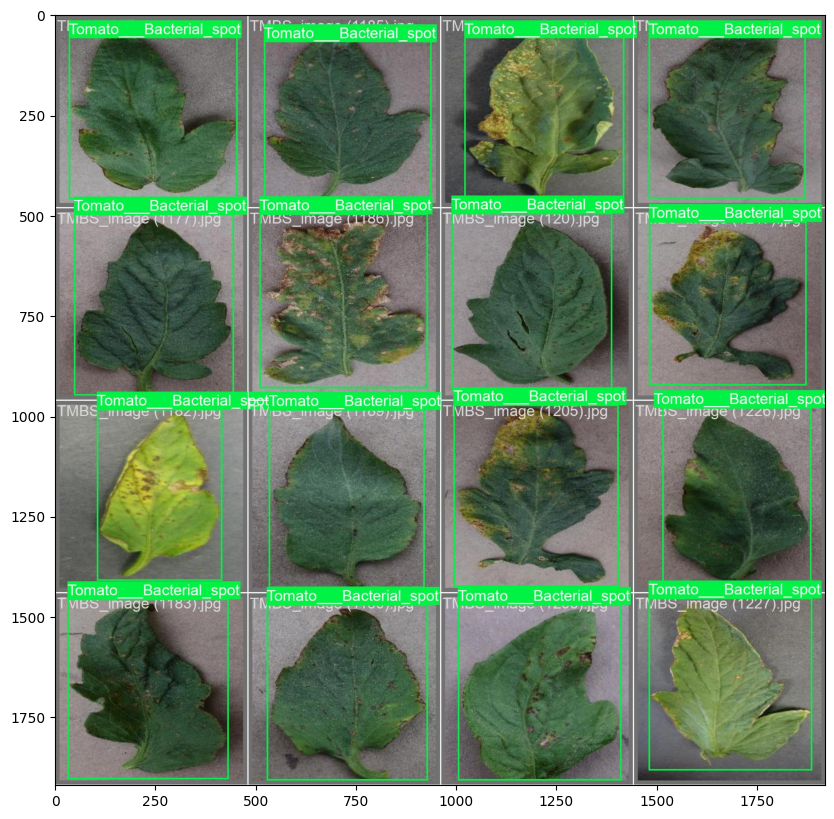

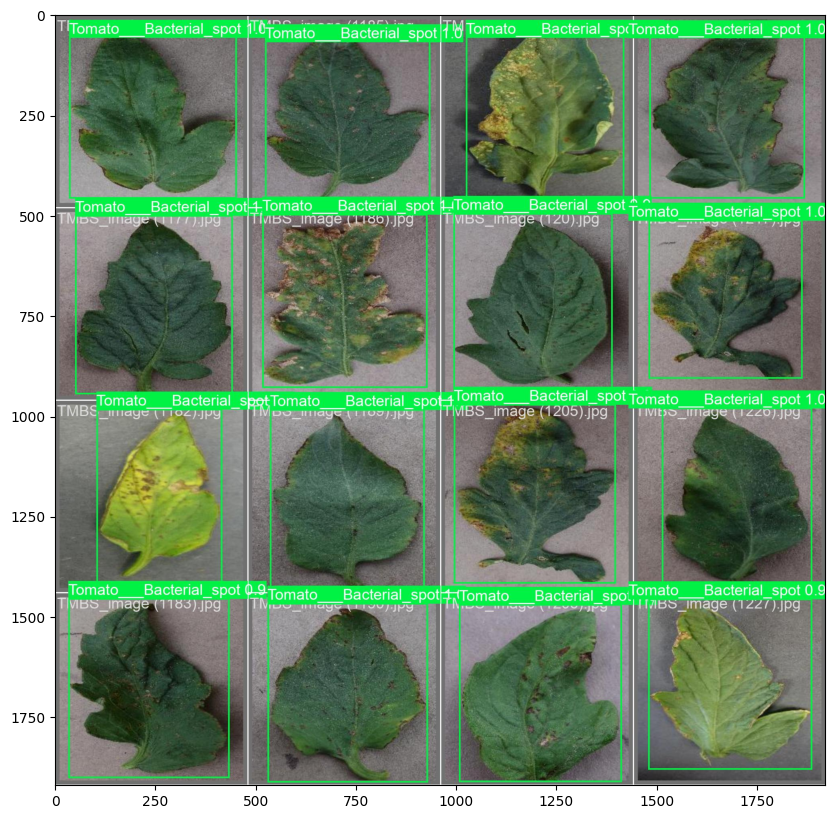

In [ ]:
for path in tpaths2:
    image = Image.open(path)
    image=np.array(image)
    plt.figure(figsize=(20,10))
    plt.imshow(image)
    plt.show()

In [9]:
for path in tpaths3:
    image = Image.open(path)
    image=np.array(image)
    plt.figure(figsize=(20,10))
    plt.imshow(image)
    plt.show()

In [5]:
from ultralytics import YOLO

# Load trained model
model = YOLO("runs/detect/train/weights/best.pt")

# Perform validation
metrics = model.val(
    data="/teamspace/studios/this_studio/datasets_/face.yaml",
    conf=0.2,
    iou=0.7,
    split="val"
)

# Print overall evaluation metrics
print("\n Evaluation Metrics:")
print(f"✔️ mAP@0.5: {metrics.box.map50:.4f}")
print(f"✔️ mAP@0.5:0.95: {metrics.box.map:.4f}")


Ultralytics 8.3.111 🚀 Python-3.10.10 torch-2.2.1+cu121 CUDA:0 (NVIDIA L40S, 45596MiB)
YOLO11n summary (fused): 100 layers, 2,589,562 parameters, 0 gradients, 6.4 GFLOPs
val: Fast image access ✅ (ping: 0.1±0.1 ms, read: 66.5±90.8 MB/s, size: 14.3 KB)


val: Scanning /teamspace/studios/this_studio/datasets_/valid... 3392 images, 0 backgrounds, 0 corrupt:  31%|███       | 3392/10858 [00:01<00:03, 1999.19it/s]

val: Scanning /teamspace/studios/this_studio/datasets_/valid... 10858 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10858/10858 [00:30<00:00, 355.12it/s]


val: New cache created: /teamspace/studios/this_studio/datasets_/valid.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 679/679 [00:34<00:00, 19.53it/s]


                   all      10858      10869      0.992      0.994      0.994      0.988
    Apple___Apple_scab        131        131          1      0.999      0.995      0.989
     Apple___Black_rot        145        145      0.995          1      0.995      0.992
Apple___Cedar_apple_rust         63         63          1          1      0.995      0.995
       Apple___healthy        348        348      0.995          1      0.995      0.985
   Blueberry___healthy        305        305          1          1      0.995      0.988
Cherry___Powdery_mildew        246        246          1      0.996      0.995      0.995
      Cherry___healthy        183        183          1          1      0.995      0.993
Corn___Cercospora_leaf_spot Gray_leaf_spot        104        104      0.944      0.966      0.977      0.958
    Corn___Common_rust        236        236          1          1      0.995      0.991
Corn___Northern_Leaf_Blight        200        201      0.974      0.965      0.982     

In [1]:
import shutil

shutil.make_archive("trainyolov8_backup", 'zip', root_dir=".", base_dir="/teamspace/studios/this_studio/runs/detect/train10")


'/teamspace/studios/this_studio/trainyolov8_backup.zip'

In [2]:
import shutil

shutil.make_archive("trainyolov9_backup", 'zip', root_dir=".", base_dir="/teamspace/studios/this_studio/runs/detect/train12")


'/teamspace/studios/this_studio/trainyolov9_backup.zip'

In [8]:
from ultralytics import YOLO
import cv2
from matplotlib import pyplot as plt

# Load model
model = YOLO("runs/detect/train/weights/best.pt")

# Image path
image_path = "/teamspace/studios/this_studio/temp.jpg"

# Run prediction
results = model(image_path, conf=0.5)

# Load original image
img = cv2.imread(image_path)

# Draw boxes with custom font size
for box in results[0].boxes:
    cls_id = int(box.cls[0])
    label = results[0].names[cls_id]
    conf = float(box.conf[0])
    xyxy = box.xyxy[0].cpu().numpy().astype(int)
    x1, y1, x2, y2 = xyxy

    # Draw box
    cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

    # Prepare label
    text = f"{label} {conf:.2f}"
    font_scale = 0.3  # 👈 Adjust font size here
    thickness = 1
    (tw, th), _ = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)

    # Positioning
    text_x = x1
    text_y = max(y1 - 10, th + 5)

    # Draw background and text
    cv2.rectangle(img, (text_x, text_y - th), (text_x + tw, text_y), (0, 255, 0), -1)
    cv2.putText(img, text, (text_x, text_y), cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0, 0, 0), thickness)

# Convert BGR to RGB for display
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Show image using matplotlib
plt.figure(figsize=(10, 8))
plt.imshow(img_rgb)
plt.axis('off')
plt.show()



image 1/1 /teamspace/studios/this_studio/temp.jpg: 416x640 (no detections), 9.4ms
Speed: 1.2ms preprocess, 9.4ms inference, 0.4ms postprocess per image at shape (1, 3, 416, 640)


<Figure size 1000x800 with 1 Axes>

In [ ]:
from matplotlib import pyplot as plt
import cv2

# Read the saved image
img_bgr = cv2.imread("output_labeled.jpg")
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Display using matplotlib
plt.figure(figsize=(10, 8))
plt.imshow(img_rgb)
plt.axis('off')
plt.show()



image 1/1 /teamspace/studios/this_studio/datasets/test/TMYC_image (2639).jpg: 640x640 1 Tomato___Tomato_Yellow_Leaf_Curl_Virus, 162.0ms
Speed: 3.0ms preprocess, 162.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


True

In [11]:
model = YOLO("runs/detect/train/weights/best.pt")

In [12]:
model.predict("datasets_/test", save=True, conf=0.25)




WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs



image 1/5429 /teamspace/studios/this_studio/datasets_/test/APAS_image (108).jpg: 640x640 1 Apple___Apple_scab, 573.0ms
image 2/5429 /teamspace/studios/this_studio/datasets_/test/APAS_image (120).jpg: 640x640 1 Apple___Apple_scab, 1046.8ms
image 3/5429 /teamspace/studios/this_studio/datasets_/test/APAS_image (130).jpg: 640x640 1 Apple___Apple_scab, 108.6ms
image 4/5429 /teamspace/studios/this_studio/datasets_/test/APAS_image (135).jpg: 640x640 1 Apple___Apple_scab, 121.9ms
image 5/5429 /teamspace/studios/this_studio/datasets_/test/APAS_image (140).jpg: 640x640 1 Apple___Apple_scab, 144.0ms
image 6/5429 /teamspace/studios/this_studio/datasets_/test/APAS_image (146).jpg: 640x640 1 Apple___Apple_scab, 113.4ms
image 7/5429 /teamspace/studios/this_studio/datasets_/test/APAS_image (156).jpg: 640x640 1 Apple___Apple_scab, 130.5ms
image 8/5429 /teamspace/studios/this_studio/datasets_/test/APAS_image (183).jpg: 640x640 1 Apple___Apple_scab, 125.0ms
image 9/5429 /teamspace/studios/this_studio/dat

KeyboardInterrupt: 

In [9]:
from ultralytics import YOLO
import os

# Model-Dataset pairs
model_dataset_pairs = [
    ("YOLOv8", "runs/detect/train10/weights/best.pt", "facev8.yaml"),
    ("YOLOv9", "runs/detect/train12/weights/best.pt", "facev9.yaml"),
    ("YOLOv11", "runs/detect/train/weights/best.pt", "face.yaml")
]

def format_size(size_bytes):
    return f"{size_bytes / (1024*1024):.2f} MB"

def print_model_comparison():
    for model_name, model_path, data_yaml in model_dataset_pairs:
        model = YOLO(model_path)
        val_results = model.val(data=data_yaml, save=False, verbose=False)

        # Extract metrics from val_results.box
        precision = val_results.box.pr.mean().item() * 100 if hasattr(val_results.box, 'pr') else None
        recall = val_results.box.re.mean().item() * 100 if hasattr(val_results.box, 're') else None
        map50 = val_results.box.map50.item() * 100 if hasattr(val_results.box, 'map50') else None
        map5095 = val_results.box.map5095.item() * 100 if hasattr(val_results.box, 'map5095') else None
        inference_time = val_results.speed.get('inference', None)
        fps = 1000 / inference_time if inference_time else None

        # Model parameters (millions)
        params = sum(p.numel() for p in model.model.parameters()) / 1e6

        # Model file size (MB)
        file_size = format_size(os.path.getsize(model_path))

        # F1 score calculation
        f1 = (2 * precision * recall / (precision + recall)) if (precision and recall and (precision + recall) > 0) else None

        print(f"\n=== {model_name} ===")
        print(f"Model file: {model_path} ({file_size})")
        print(f"Number of parameters: {params:.2f} million")
        print(f"Dataset config: {data_yaml}")
        if precision is not None: print(f"Precision: {precision:.2f} %")
        if recall is not None: print(f"Recall: {recall:.2f} %")
        if f1 is not None: print(f"F1-Score: {f1:.2f} %")
        if map50 is not None: print(f"mAP@0.5: {map50:.2f} %")
        if map5095 is not None: print(f"mAP@0.5:0.95: {map5095:.2f} %")
        if inference_time is not None: print(f"Inference Time per image: {inference_time:.2f} ms")
        if fps is not None: print(f"Frames per second (FPS): {fps:.2f}")

        # Summary insights
        if model_name == "YOLOv8":
            print("Summary: Lightweight and fast, suitable for edge devices and real-time use cases.")
        elif model_name == "YOLOv9":
            print("Summary: Balanced between speed and accuracy, good for general purposes.")
        elif model_name == "YOLOv11":
            print("Summary: Highest accuracy, best for complex datasets but slower inference.")

if __name__ == "__main__":
    print_model_comparison()


Ultralytics 8.3.111 🚀 Python-3.10.10 torch-2.2.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
Model summary (fused): 72 layers, 3,013,058 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 732.6±367.0 MB/s, size: 15.1 KB)


val: Scanning /teamspace/studios/this_studio/datasets_structured/valid/labels.cache... 10858 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10858/10858 [00:00<?, ?it/s]


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 679/679 [00:43<00:00, 15.51it/s]


                   all      10858      10869      0.993      0.992      0.994      0.988
Speed: 0.2ms preprocess, 1.6ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to runs/detect/val20

=== YOLOv8 ===
Model file: runs/detect/train10/weights/best.pt (5.97 MB)
Number of parameters: 3.01 million
Dataset config: facev8.yaml
mAP@0.5: 99.41 %
Inference Time per image: 1.61 ms
Frames per second (FPS): 619.72
Summary: Lightweight and fast, suitable for edge devices and real-time use cases.
Ultralytics 8.3.111 🚀 Python-3.10.10 torch-2.2.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
YOLOv9c summary (fused): 156 layers, 25,348,546 parameters, 0 gradients, 102.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 611.9±319.3 MB/s, size: 16.6 KB)


val: Scanning /teamspace/studios/this_studio/datasets_structured/valid/labels.cache... 10858 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10858/10858 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 679/679 [03:02<00:00,  3.71it/s]


                   all      10858      10869      0.997      0.995      0.995      0.992
Speed: 0.2ms preprocess, 14.5ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to runs/detect/val21

=== YOLOv9 ===
Model file: runs/detect/train12/weights/best.pt (49.26 MB)
Number of parameters: 25.35 million
Dataset config: facev9.yaml
mAP@0.5: 99.47 %
Inference Time per image: 14.46 ms
Frames per second (FPS): 69.15
Summary: Balanced between speed and accuracy, good for general purposes.
Ultralytics 8.3.111 🚀 Python-3.10.10 torch-2.2.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
YOLO11n summary (fused): 100 layers, 2,589,562 parameters, 0 gradients, 6.4 GFLOPs


FileNotFoundError: 
Dataset 'face.yaml' images not found ⚠️, missing path '/teamspace/studios/this_studio/datasets/datasets_/valid'
Note dataset download directory is '/teamspace/studios/this_studio/datasets'. You can update this in '/teamspace/studios/this_studio/.config/Ultralytics/settings.json'

In [11]:
from ultralytics import YOLO
import os

# YOLOv11 model and dataset
model_name = "YOLOv11"
model_path = "runs/detect/train/weights/best.pt"
data_yaml = "/teamspace/studios/this_studio/datasets_/face.yaml"

def format_size(size_bytes):
    return f"{size_bytes / (1024*1024):.2f} MB"

def print_yolov11_metrics():
    model = YOLO(model_path)
    val_results = model.val(data=data_yaml, save=False, verbose=False)

    # Extract metrics from val_results.box
    precision = val_results.box.pr.mean().item() * 100 if hasattr(val_results.box, 'pr') else None
    recall = val_results.box.re.mean().item() * 100 if hasattr(val_results.box, 're') else None
    map50 = val_results.box.map50.item() * 100 if hasattr(val_results.box, 'map50') else None
    map5095 = val_results.box.map5095.item() * 100 if hasattr(val_results.box, 'map5095') else None
    inference_time = val_results.speed.get('inference', None)
    fps = 1000 / inference_time if inference_time else None

    # Model parameters (millions)
    params = sum(p.numel() for p in model.model.parameters()) / 1e6

    # Model file size (MB)
    file_size = format_size(os.path.getsize(model_path))

    # F1 score calculation
    f1 = (2 * precision * recall / (precision + recall)) if (precision and recall and (precision + recall) > 0) else None

    print(f"\n=== {model_name} ===")
    print(f"Model file: {model_path} ({file_size})")
    print(f"Number of parameters: {params:.2f} million")
    print(f"Dataset config: {data_yaml}")
    if precision is not None: print(f"Precision: {precision:.2f} %")
    if recall is not None: print(f"Recall: {recall:.2f} %")
    if f1 is not None: print(f"F1-Score: {f1:.2f} %")
    if map50 is not None: print(f"mAP@0.5: {map50:.2f} %")
    if map5095 is not None: print(f"mAP@0.5:0.95: {map5095:.2f} %")
    if inference_time is not None: print(f"Inference Time per image: {inference_time:.2f} ms")
    if fps is not None: print(f"Frames per second (FPS): {fps:.2f}")

    print("Summary: Highest accuracy, best for complex datasets but slower inference.")

if __name__ == "__main__":
    print_yolov11_metrics()


Ultralytics 8.3.111 🚀 Python-3.10.10 torch-2.2.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
YOLO11n summary (fused): 100 layers, 2,589,562 parameters, 0 gradients, 6.4 GFLOPs


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 448.0±258.1 MB/s, size: 14.3 KB)


val: Scanning /teamspace/studios/this_studio/datasets_/valid.cache... 10858 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10858/10858 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 679/679 [01:01<00:00, 11.00it/s]


                   all      10858      10869      0.992      0.994      0.994      0.988
Speed: 0.2ms preprocess, 1.8ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to runs/detect/val24

=== YOLOv11 ===
Model file: runs/detect/train/weights/best.pt (5.23 MB)
Number of parameters: 2.59 million
Dataset config: /teamspace/studios/this_studio/datasets_/face.yaml
mAP@0.5: 99.43 %
Inference Time per image: 1.82 ms
Frames per second (FPS): 550.00
Summary: Highest accuracy, best for complex datasets but slower inference.


In [12]:
from ultralytics import YOLO

# Model-Dataset pairs
model_dataset_pairs = [
    ("YOLOv8", "runs/detect/train10/weights/best.pt", "facev8.yaml"),
    ("YOLOv9", "runs/detect/train12/weights/best.pt", "facev9.yaml"),
    ("YOLOv11", "runs/detect/train/weights/best.pt", "/teamspace/studios/this_studio/datasets_/face.yaml")
]

for model_name, model_path, data_yaml in model_dataset_pairs:
    model = YOLO(model_path)

    val_results = model.val(data=data_yaml, save=False, verbose=False)

    precision = val_results.box.pr.mean().item() * 100
    recall = val_results.box.re.mean().item() * 100
    map50 = val_results.box.map50.item() * 100
    f1 = val_results.box.f1.mean().item() * 100
    inference_time = val_results.speed['inference']  # ms

    print(f"=== {model_name} ===")
    print(f"Precision (%): {precision:.2f}")
    print(f"Recall (%): {recall:.2f}")
    print(f"mAP@0.5 (%): {map50:.2f}")
    print(f"F1-Score (%): {f1:.2f}")
    print(f"Inference Time (ms): {inference_time:.2f}")
    print()


Ultralytics 8.3.111 🚀 Python-3.10.10 torch-2.2.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
Model summary (fused): 72 layers, 3,013,058 parameters, 0 gradients, 8.1 GFLOPs
val: WARNING ⚠️ Slow image access detected (ping: 36.5±81.5 ms, read: 558.8±244.8 MB/s, size: 16.1 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips/


val: Scanning /teamspace/studios/this_studio/datasets_structured/valid/labels.cache... 10858 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10858/10858 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 679/679 [00:44<00:00, 15.20it/s]


                   all      10858      10869      0.993      0.992      0.994      0.988
Speed: 0.2ms preprocess, 1.6ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to runs/detect/val25


AttributeError: 'Metric' object has no attribute 'pr'. See valid attributes below.

    Class for computing evaluation metrics for YOLOv8 model.

    Attributes:
        p (list): Precision for each class. Shape: (nc,).
        r (list): Recall for each class. Shape: (nc,).
        f1 (list): F1 score for each class. Shape: (nc,).
        all_ap (list): AP scores for all classes and all IoU thresholds. Shape: (nc, 10).
        ap_class_index (list): Index of class for each AP score. Shape: (nc,).
        nc (int): Number of classes.

    Methods:
        ap50(): AP at IoU threshold of 0.5 for all classes. Returns: List of AP scores. Shape: (nc,) or [].
        ap(): AP at IoU thresholds from 0.5 to 0.95 for all classes. Returns: List of AP scores. Shape: (nc,) or [].
        mp(): Mean precision of all classes. Returns: Float.
        mr(): Mean recall of all classes. Returns: Float.
        map50(): Mean AP at IoU threshold of 0.5 for all classes. Returns: Float.
        map75(): Mean AP at IoU threshold of 0.75 for all classes. Returns: Float.
        map(): Mean AP at IoU thresholds from 0.5 to 0.95 for all classes. Returns: Float.
        mean_results(): Mean of results, returns mp, mr, map50, map.
        class_result(i): Class-aware result, returns p[i], r[i], ap50[i], ap[i].
        maps(): mAP of each class. Returns: Array of mAP scores, shape: (nc,).
        fitness(): Model fitness as a weighted combination of metrics. Returns: Float.
        update(results): Update metric attributes with new evaluation results.
    